Imports and definitions

In [48]:
from __future__ import print_function, division

import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
import numpy as np
import torchvision
from torchvision import datasets, models, transforms
import matplotlib.pyplot as plt
import time
import os
import copy
import tensorflow as tf
import cv2
import tqdm
from sklearn.preprocessing import LabelBinarizer
from PIL import Image
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, ConfusionMatrixDisplay, classification_report

plt.ion() 
#this transform will be used also for video frames
test_transf = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])#mean and std from imagenet of rgb channels
]);
# Data augmentation and normalization for training
# Just normalization for validation
#Images are 224,224,3 jpg
data_transforms = {
    'train': transforms.Compose([
        transforms.RandomResizedCrop(224),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'test': test_transf
}

data_dir = 'D:/Drive/ML/sport_data'
image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x),
                                          data_transforms[x])
                  for x in ['train', 'test']}
dataloaders = {x: torch.utils.data.DataLoader(image_datasets[x], batch_size=4,
                                             shuffle=True, num_workers=2)
              for x in ['train', 'test']}
dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'test']}
class_names = image_datasets['train'].classes

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

#method to call after cnn model provides output
normalizeResult = nn.Softmax(dim=1)

#this is an imshow method for the result tensor on CNN models, it is needed to invert the transformation 
def imshow(inp, title=None):
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)  # pause a bit so that plots are updated

def train_model(model, criterion, optimizer, scheduler, num_epochs=25):
    since = time.time() #track time

    best_model_wts = copy.deepcopy(model.state_dict()) #it will contain the best weights
    best_acc = 0.0 # best accuracy

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)

        # Each epoch has a training and test phase
        for phase in ['train', 'test']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients every epoch so the gradient follows weights and biases of the current epoch only
                optimizer.zero_grad()

                # forward
                # track history (gradient) if only in train 
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics, summing to get the mean for each epoch
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
            if phase == 'train':
                scheduler.step() #eventually update learning rate

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]

            print('{} Loss: {:.4f} Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_acc))

            # deep copy the model
            if phase == 'train' and epoch_acc > best_acc:
                #we use for comparison train accuracy because test accuracy reaches 100% too soon
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())

        print()

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best test Acc: {:4f}'.format(best_acc))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model

# get predicted and ground truth labels for CNNs
def getAnalysisData(model, setType):
    pred_labels = []
    ground_truth = []

    for i, (inputs, labels) in enumerate(dataloaders[setType]):
        model.eval()
        with torch.no_grad():
            inputs = inputs.to(device)
            labels = labels.to(device)
            outputs = model(inputs)
            res = normalizeResult(outputs)
            conf, predicted = torch.max(res, 1)

            pred_labels.extend(predicted.detach().cpu().numpy().flatten().tolist())
            ground_truth.extend(labels.detach().cpu().numpy().flatten().tolist())

    return pred_labels,ground_truth

#print precision,accuracy,recall and confusion matrix
def analysis(pred_labels,ground_truth):
    accuracy = accuracy_score(ground_truth, pred_labels)
    print('Accuracy: {}'.format(accuracy))

    precision = precision_score(ground_truth, pred_labels, average='weighted')
    print('Precision: {}'.format(precision))

    recall = recall_score(ground_truth, pred_labels, average='weighted')
    print('Recall: {}'.format(recall))

    cm = confusion_matrix(ground_truth, pred_labels)
    disp = ConfusionMatrixDisplay(cm, display_labels = class_names)
    #fig = plt.figure(figsize=(20, 20))
    fig = plt.figure()
    ax = fig.add_subplot(111)
    disp.plot(ax = ax,xticks_rotation='vertical')
    
    print(classification_report(ground_truth, pred_labels, digits=3, target_names=class_names))

# parameters for CNNs
criterion = nn.CrossEntropyLoss()
# Observe that all parameters are being optimized
optimizer_ft = optim.SGD(model_ft.parameters(), lr=0.0001, momentum=0.9)
# Decay learning rate by a factor of 0.1 every 7 epochs
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1)

# a method to see some random result
def visualize_model(model, num_images=6):
    was_training = model.training
    model.eval()
    images_so_far = 0
    fig = plt.figure()

    with torch.no_grad():
        for i, (inputs, labels) in enumerate(dataloaders['test']):
            inputs = inputs.to(device)
            labels = labels.to(device)
            outputs = model(inputs)
            res = normalizeResult(outputs)
            conf, preds = torch.max(res, 1)

            for j in range(inputs.size()[0]):
                images_so_far += 1
                ax = plt.subplot(num_images//2, 2, images_so_far)
                ax.axis('off')
                
                ax.set_title('predicted: {}, confidence: {}'.format(class_names[preds[j]], conf[j]))
                imshow(inputs.cpu().data[j])

                if images_so_far == num_images:
                    model.train(mode=was_training)
                    return
        model.train(mode=was_training)

CNN models

In [11]:
#fine tune model, replace last layer and let feedback 
model_ft = models.resnet18(pretrained=True)
num_ftrs = model_ft.fc.in_features
model_ft.fc = nn.Linear(num_ftrs, len(class_names))
model_ft = model_ft.to(device)

In [12]:
model_ft.load_state_dict(torch.load(data_dir+'/model_ft_min'))

<All keys matched successfully>

In [10]:
model_ft = train_model(model_ft, criterion, optimizer_ft, exp_lr_scheduler,
                       num_epochs=25)
torch.save(model_ft.state_dict(), data_dir+'/model_ft_min')

Epoch 0/24
----------
train Loss: 2.1242 Acc: 0.3142
test Loss: 1.0968 Acc: 0.7667

Epoch 1/24
----------
train Loss: 1.5061 Acc: 0.6007
test Loss: 0.4895 Acc: 0.9000

Epoch 2/24
----------
train Loss: 1.2160 Acc: 0.6591
test Loss: 0.2935 Acc: 0.9500

Epoch 3/24
----------
train Loss: 0.9264 Acc: 0.7503
test Loss: 0.1536 Acc: 0.9833

Epoch 4/24
----------
train Loss: 0.8717 Acc: 0.7508
test Loss: 0.1150 Acc: 0.9833

Epoch 5/24
----------
train Loss: 0.8137 Acc: 0.7597
test Loss: 0.0835 Acc: 0.9833

Epoch 6/24
----------
train Loss: 0.7244 Acc: 0.7942
test Loss: 0.0777 Acc: 0.9833

Epoch 7/24
----------
train Loss: 0.7009 Acc: 0.7981
test Loss: 0.0610 Acc: 0.9833

Epoch 8/24
----------
train Loss: 0.7412 Acc: 0.7742
test Loss: 0.0522 Acc: 1.0000

Epoch 9/24
----------
train Loss: 0.6729 Acc: 0.8103
test Loss: 0.0501 Acc: 1.0000

Epoch 10/24
----------
train Loss: 0.6595 Acc: 0.8098
test Loss: 0.0426 Acc: 1.0000

Epoch 11/24
----------
train Loss: 0.6524 Acc: 0.8076
test Loss: 0.0522 Acc

In [13]:
#feature extraction only, replace last layer and do not let feedback 
model_fe = models.resnet18(pretrained=True)
for param in model_fe.parameters():
    param.requires_grad = False
num_ftrs = model_fe.fc.in_features
model_fe.fc = nn.Linear(num_ftrs, len(class_names))
model_fe = model_fe.to(device)


In [14]:
model_fe.load_state_dict(torch.load(data_dir+'/model_fe_min'))

<All keys matched successfully>

In [61]:
model_fe = train_model(model_fe, criterion, optimizer_fe, exp_lr_scheduler,
                       num_epochs=25)
torch.save(model_fe.state_dict(), data_dir+'/model_fe_min')

Epoch 0/24
----------
train Loss: 1.6950 Acc: 0.4555
test Loss: 0.2553 Acc: 0.9167

Epoch 1/24
----------
train Loss: 1.0481 Acc: 0.6641
test Loss: 0.1088 Acc: 1.0000

Epoch 2/24
----------
train Loss: 0.9109 Acc: 0.7036
test Loss: 0.0951 Acc: 0.9667

Epoch 3/24
----------
train Loss: 0.8684 Acc: 0.7291
test Loss: 0.0590 Acc: 0.9833

Epoch 4/24
----------
train Loss: 0.8572 Acc: 0.7186
test Loss: 0.0573 Acc: 1.0000

Epoch 5/24
----------
train Loss: 0.7330 Acc: 0.7703
test Loss: 0.0324 Acc: 1.0000

Epoch 6/24
----------
train Loss: 0.7515 Acc: 0.7564
test Loss: 0.0287 Acc: 1.0000

Epoch 7/24
----------
train Loss: 0.6957 Acc: 0.7809
test Loss: 0.0219 Acc: 1.0000

Epoch 8/24
----------
train Loss: 0.6598 Acc: 0.7848
test Loss: 0.0349 Acc: 1.0000

Epoch 9/24
----------
train Loss: 0.7098 Acc: 0.7686
test Loss: 0.0263 Acc: 1.0000

Epoch 10/24
----------
train Loss: 0.6083 Acc: 0.8009
test Loss: 0.0280 Acc: 1.0000

Epoch 11/24
----------
train Loss: 0.6391 Acc: 0.7925
test Loss: 0.0328 Acc

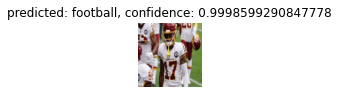

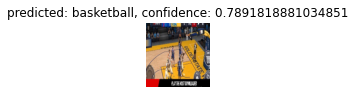

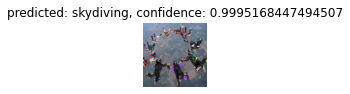

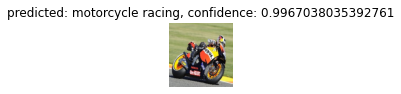

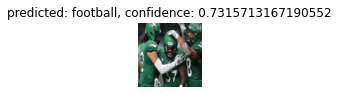

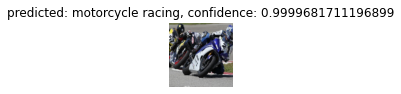

In [16]:
visualize_model(model_ft)

Script for frame extraction

In [139]:
result

[['0:00:00.033333', 0.99492586],
 ['0:00:19.333331', 0.9915319],
 ['0:00:19.433331', 0.99137664],
 ['0:00:19.533331', 0.9971096],
 ['0:00:19.733331', 0.9908087],
 ['0:00:19.833331', 0.99906856],
 ['0:00:19.933331', 0.9994301],
 ['0:00:20.033331', 0.99385154],
 ['0:03:51.333311', 0.9939183],
 ['0:03:51.433311', 0.99640286],
 ['0:03:51.533311', 0.994228],
 ['0:03:51.633311', 0.99420303],
 ['0:03:51.733311', 0.9963117],
 ['0:03:51.833311', 0.99945766],
 ['0:03:51.933311', 0.99871504],
 ['0:07:07.633292', 0.99874985],
 ['0:07:07.733292', 0.99941695],
 ['0:07:07.833292', 0.9992212],
 ['0:07:08.133292', 0.9997708],
 ['0:07:08.233292', 0.998083],
 ['0:07:08.333292', 0.9991592],
 ['0:07:18.833291', 0.99798787],
 ['0:07:18.933291', 0.9980751],
 ['0:07:19.033291', 0.9993173],
 ['0:07:19.133291', 0.99946207],
 ['0:07:19.233291', 0.9982759],
 ['0:07:19.333291', 0.9953962],
 ['0:07:19.433291', 0.99699044],
 ['0:07:19.533291', 0.9944171],
 ['0:07:20.333291', 0.9939044],
 ['0:07:21.033291', 0.9925344

Accuracy: 1.0
Precision: 1.0
Recall: 1.0
                   precision    recall  f1-score   support

       basketball      1.000     1.000     1.000         5
              bmx      1.000     1.000     1.000         5
         football      1.000     1.000     1.000         5
             golf      1.000     1.000     1.000         5
motorcycle racing      1.000     1.000     1.000         5
            rugby      1.000     1.000     1.000         5
        skydiving      1.000     1.000     1.000         5
    snow boarding      1.000     1.000     1.000         5
          surfing      1.000     1.000     1.000         5
         swimming      1.000     1.000     1.000         5
           tennis      1.000     1.000     1.000         5
       volleyball      1.000     1.000     1.000         5

         accuracy                          1.000        60
        macro avg      1.000     1.000     1.000        60
     weighted avg      1.000     1.000     1.000        60



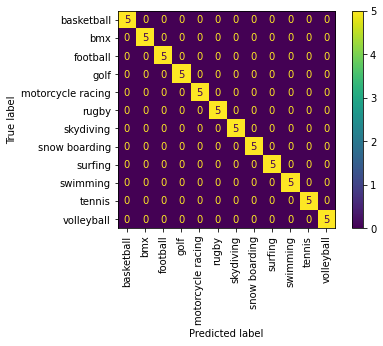

In [49]:
pred_labels, ground_truth = getAnalysisData(model_ft, 'test')
analysis(pred_labels, ground_truth)

Accuracy: 0.9271412680756396
Precision: 0.9288250889690218
Recall: 0.9271412680756396
                   precision    recall  f1-score   support

       basketball      0.868     0.935     0.900       169
              bmx      0.968     0.857     0.909       140
         football      0.921     0.916     0.919       191
             golf      0.880     0.936     0.907       157
motorcycle racing      0.947     0.939     0.943       132
            rugby      0.940     0.940     0.940       166
        skydiving      0.918     0.973     0.945       149
    snow boarding      0.964     0.915     0.939       117
          surfing      0.951     0.951     0.951       142
         swimming      0.993     0.968     0.981       157
           tennis      0.870     0.916     0.892       131
       volleyball      0.941     0.871     0.905       147

         accuracy                          0.927      1798
        macro avg      0.930     0.926     0.927      1798
     weighted avg      0.92

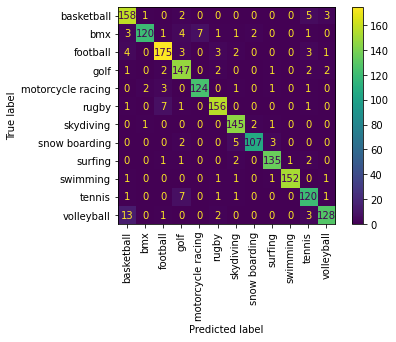

In [51]:
pred_labels, ground_truth = getAnalysisData(model_ft, 'train')
analysis(pred_labels, ground_truth)

Accuracy: 1.0
Precision: 1.0
Recall: 1.0
                   precision    recall  f1-score   support

       basketball      1.000     1.000     1.000         5
              bmx      1.000     1.000     1.000         5
         football      1.000     1.000     1.000         5
             golf      1.000     1.000     1.000         5
motorcycle racing      1.000     1.000     1.000         5
            rugby      1.000     1.000     1.000         5
        skydiving      1.000     1.000     1.000         5
    snow boarding      1.000     1.000     1.000         5
          surfing      1.000     1.000     1.000         5
         swimming      1.000     1.000     1.000         5
           tennis      1.000     1.000     1.000         5
       volleyball      1.000     1.000     1.000         5

         accuracy                          1.000        60
        macro avg      1.000     1.000     1.000        60
     weighted avg      1.000     1.000     1.000        60



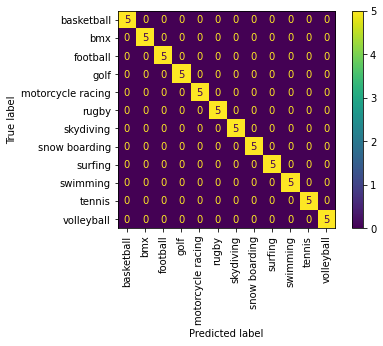

In [54]:
pred_labels, ground_truth = getAnalysisData(model_fe, 'test')
analysis(pred_labels, ground_truth)

Accuracy: 0.9060066740823137
Precision: 0.9079061253819447
Recall: 0.9060066740823137
                   precision    recall  f1-score   support

       basketball      0.848     0.893     0.870       169
              bmx      0.919     0.886     0.902       140
         football      0.933     0.874     0.903       191
             golf      0.917     0.917     0.917       157
motorcycle racing      0.912     0.947     0.929       132
            rugby      0.904     0.910     0.907       166
        skydiving      0.979     0.919     0.948       149
    snow boarding      0.897     0.889     0.893       117
          surfing      0.909     0.915     0.912       142
         swimming      0.937     0.943     0.940       157
           tennis      0.805     0.916     0.857       131
       volleyball      0.921     0.871     0.895       147

         accuracy                          0.906      1798
        macro avg      0.907     0.907     0.906      1798
     weighted avg      0.90

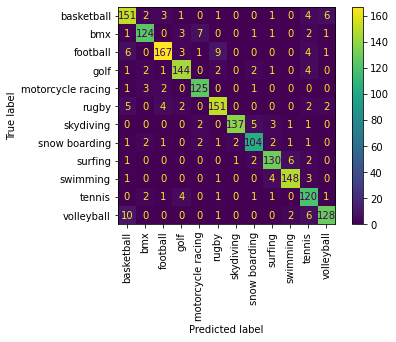

In [55]:
pred_labels, ground_truth = getAnalysisData(model_fe, 'train')
analysis(pred_labels, ground_truth)

Total frames: 36752
progress: 5.0%


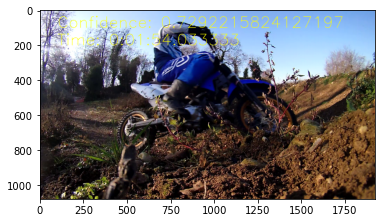

progress: 10.0%


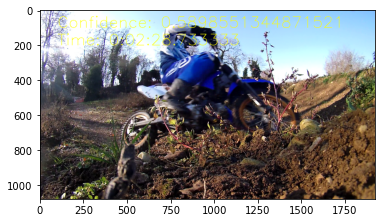

progress: 15.0%


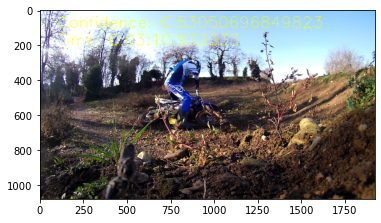

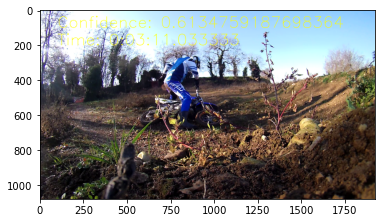

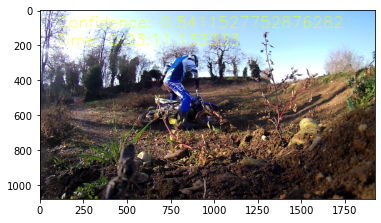

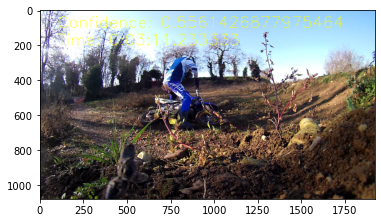

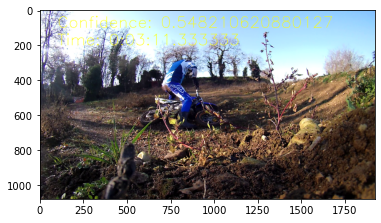

...

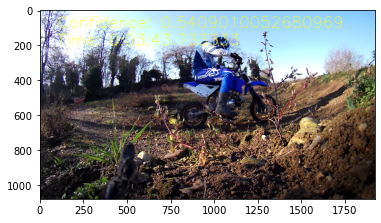

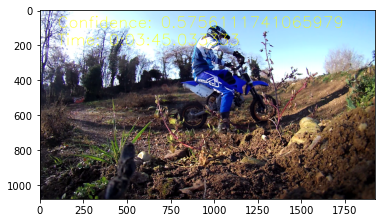

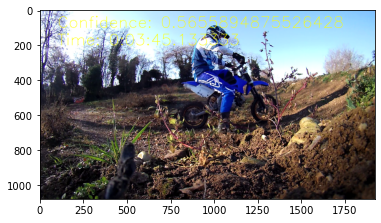

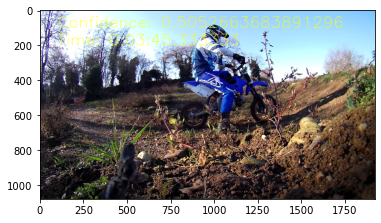

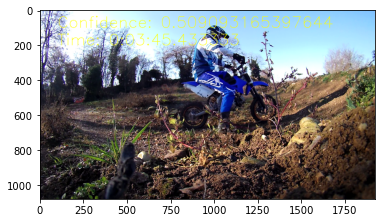

progress: 20.0%


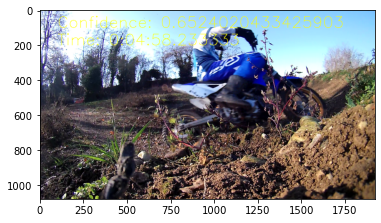

progress: 25.0%


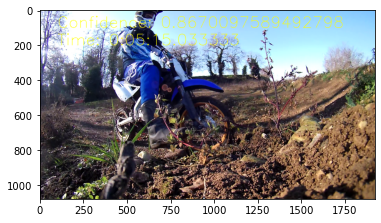

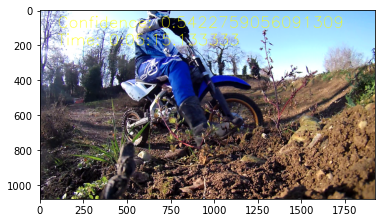

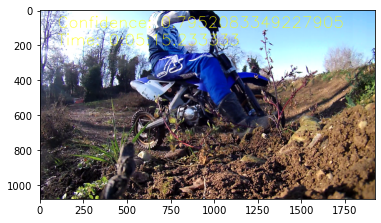

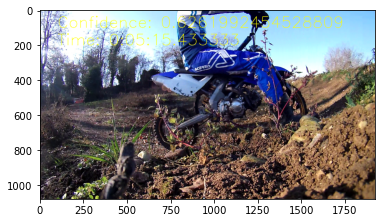

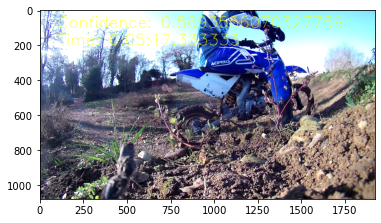

...

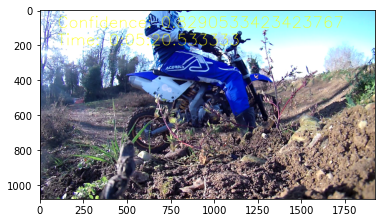

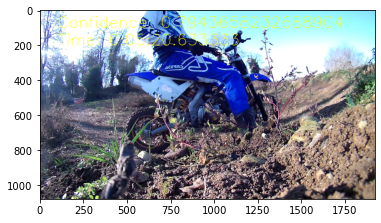

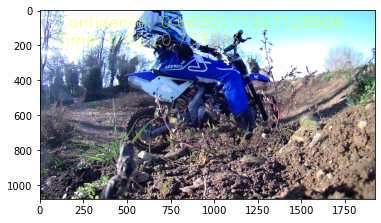

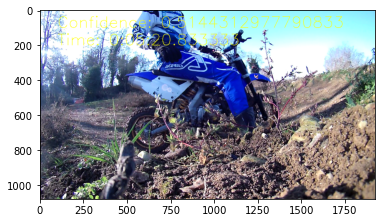

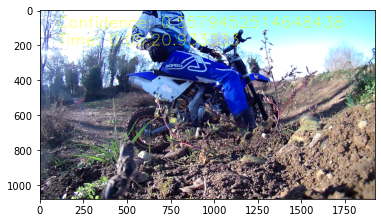

progress: 30.0%
progress: 35.0%
progress: 40.0%
progress: 45.0%


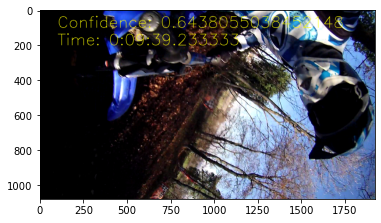

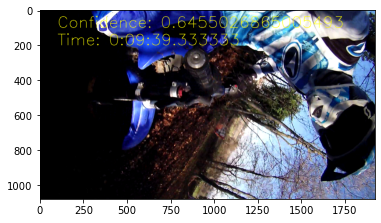

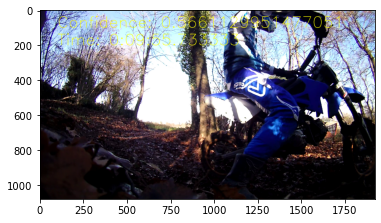

progress: 50.0%


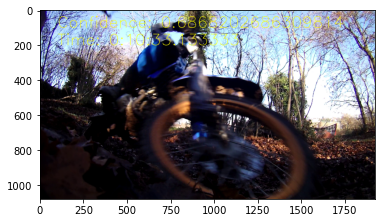

progress: 55.0%
progress: 60.0%


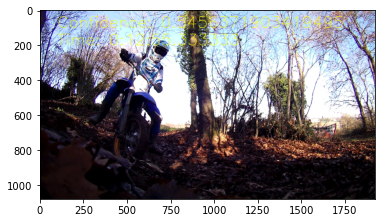

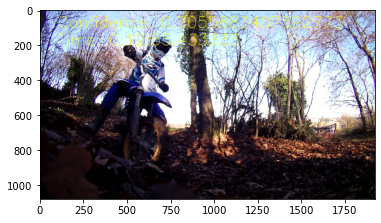

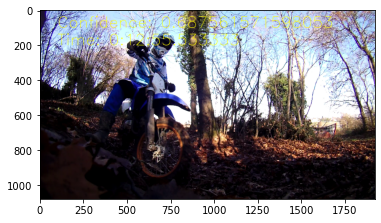

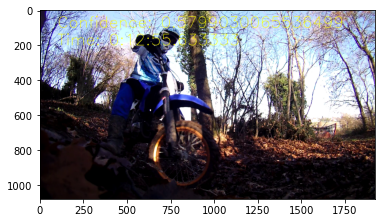

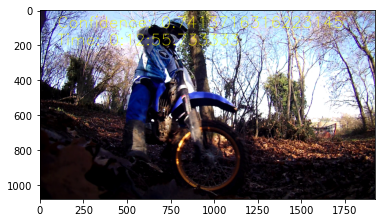

...

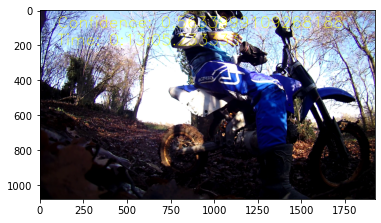

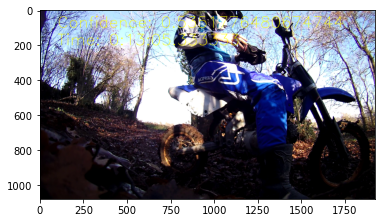

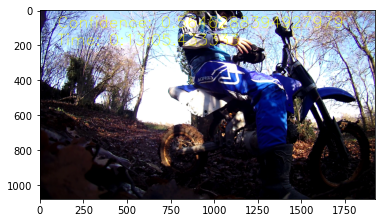

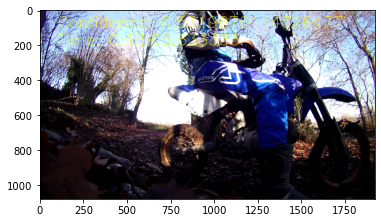

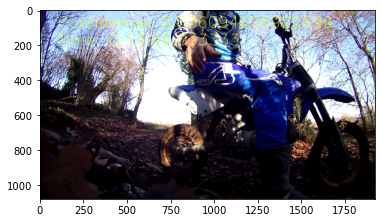

progress: 65.0%


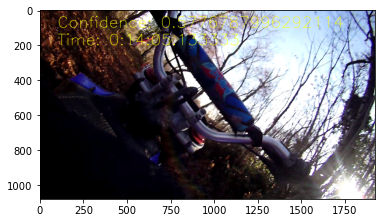

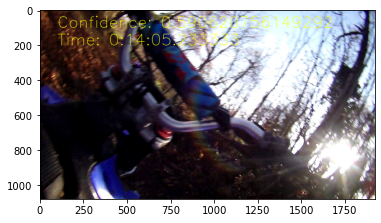

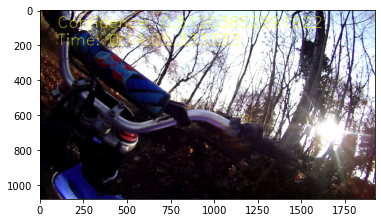

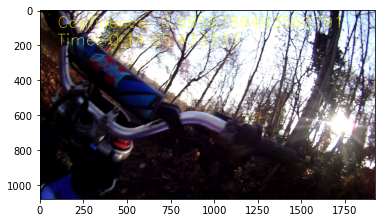

progress: 70.0%


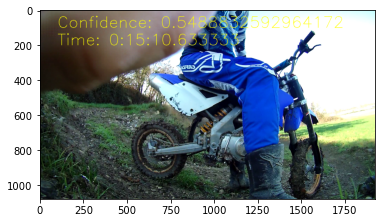

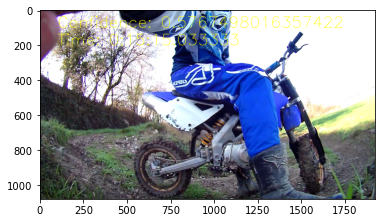

progress: 75.0%


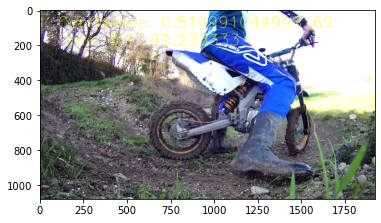

progress: 80.0%
progress: 85.0%


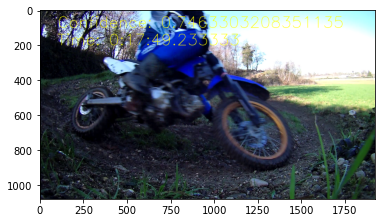

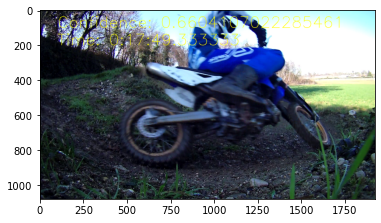

progress: 90.0%
progress: 95.0%


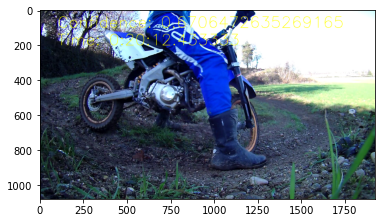

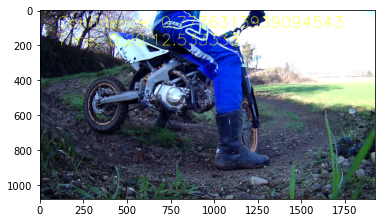

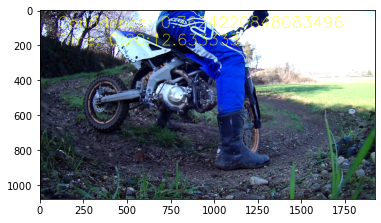

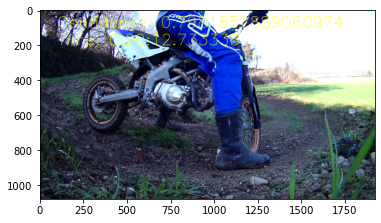

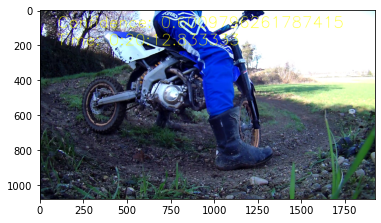

...

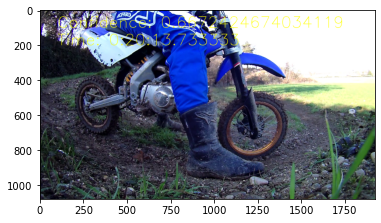

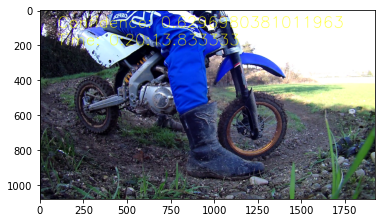

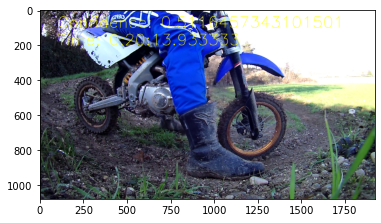

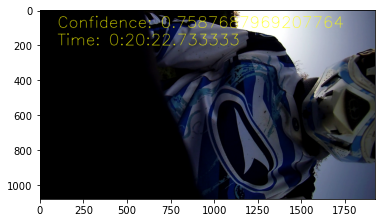

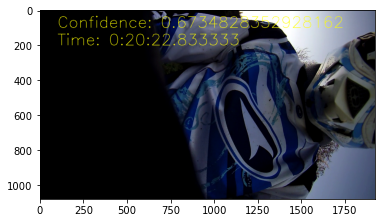

progress: 100.0%
progress: 100%


In [21]:
import datetime

#videoPath = 'D:/Drive/ML/sport_data/images to predict/test_snow.mp4'
#videoPath = 'D:/snowboard/GH020473_up.MP4'
videoPath = 'D:/pit_static.MOV'
#saveFolder = 'D:/snowboard/GH020473_frames_fe_min_99'
#saveFolder = 'D:/snowboard/test_snow_ft_min'
saveFolder = 'D:/pit_static_frames'
classToFind = 4 #7 #snowboard,4 motorcycle
desiredFps = 10
print_perc = 5
threshold = 0.5
model = model_ft

if not os.path.exists(saveFolder):
    os.makedirs(saveFolder)

result = []

cap = cv2.VideoCapture(videoPath)
num_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
print('Total frames: {}'.format(num_frames))
sample_every_frame = int(cap.get(cv2.CAP_PROP_FPS)/desiredFps)
current_frame = 0
print_step = int(num_frames/(100/print_perc))
max_images = int(num_frames/sample_every_frame)

font = cv2.FONT_HERSHEY_SIMPLEX

os.chdir(saveFolder)

model.eval()
with torch.no_grad():
    while True:
        success, image = cap.read()
        #print(success)
        if not success:
            continue

        if current_frame % sample_every_frame == 0:
            # OPENCV reads in BGR, tensorflow expects RGB so we invert the order
            max_images -= 1
            frame = image[:, :, ::-1]
            frame = Image.fromarray(frame)
            frame = test_transf(frame)
            frame = frame.unsqueeze(0).to(device)

            outputs = model(frame)
            res = normalizeResult(outputs)
            conf, preds = torch.max(res, 1)
            if preds == classToFind and res[0,classToFind] > threshold:
                
                conf = conf.cpu().detach().numpy()[0]
                timestamp = datetime.timedelta(milliseconds = cap.get(cv2.CAP_PROP_POS_MSEC))
                cv2.putText(image, 'Confidence: {}'.format(conf), (100, 100), font, 3, (0, 255, 255),2,4)
                cv2.putText(image, 'Time: {}'.format(timestamp), (100, 200), font, 3, (0, 255, 255),2,4)
                cv2.imwrite('frame_{}.jpg'.format(current_frame),image)
                result.append([timestamp.__str__(), conf])
                image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
                plt.imshow(image)
                plt.show()
               
                #print('Confidence: {} at time: {}'.format(conf, timestamp))

            #frames = torch.cat((frames, frame), 0)

        if max_images == 0:
            print('progress: 100%')
            break
        current_frame += 1
        if current_frame % print_step == 0:
            print('progress: {}%'.format(print_perc*current_frame/print_step))
        #print(max_images,current_frame)
    #return images,frames


In [22]:
result

[['0:01:54.033333', 0.7292216],
 ['0:02:28.733333', 0.58985513],
 ['0:03:10.933333', 0.53050697],
 ['0:03:11.033333', 0.6134759],
 ['0:03:11.133333', 0.5411528],
 ['0:03:11.233333', 0.5561427],
 ['0:03:11.333333', 0.5482106],
 ['0:03:11.433333', 0.5065426],
 ['0:03:17.633333', 0.577114],
 ['0:03:17.733333', 0.5159138],
 ['0:03:37.633333', 0.54147184],
 ['0:03:38.733333', 0.7212719],
 ['0:03:43.733333', 0.540901],
 ['0:03:45.033333', 0.5756112],
 ['0:03:45.133333', 0.5655895],
 ['0:03:45.333333', 0.50526637],
 ['0:03:45.433333', 0.50909317],
 ['0:04:58.233333', 0.65240204],
 ['0:05:15.033333', 0.86700976],
 ['0:05:15.133333', 0.5422759],
 ['0:05:15.233333', 0.79520833],
 ['0:05:15.433333', 0.62619925],
 ['0:05:17.333333', 0.5693556],
 ['0:05:17.633333', 0.57735133],
 ['0:05:17.833333', 0.6026931],
 ['0:05:17.933333', 0.5226949],
 ['0:05:18.433333', 0.8760645],
 ['0:05:18.533333', 0.8570277],
 ['0:05:18.633333', 0.8692709],
 ['0:05:18.733333', 0.8604956],
 ['0:05:18.833333', 0.8491993],


Prepare data for other models

In [62]:
from sklearn.decomposition import PCA
from glob import iglob
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

images = []
train_labels = []
for path in iglob(data_dir+'/train/*/*.jpg'):
    img = np.asarray(Image.open(path).convert('L'),dtype=np.uint).flatten()
    label = class_names.index(os.path.basename(os.path.dirname(path)))
    train_labels.append(label)
    images.append(img)
images = np.array(scaler.fit_transform(images))


In [35]:
pca = PCA(n_components=0.8) #80% explained variance
pca.fit(images)
trainImages = pca.transform(images) #this takes a lot

In [36]:
torch.save([trainImages, pca],data_dir+'/pcaData')

In [63]:
import torch
trainImages, pca = torch.load(data_dir+'/pcaData')

In [37]:
pca.n_components_

171

In [64]:
test_images = []
test_labels = []
from glob import iglob
for path in iglob(data_dir+'/test/*/*.jpg'):
    img = np.asarray(Image.open(path).convert('L'),dtype=np.uint).flatten()
    label = class_names.index(os.path.basename(os.path.dirname(path)))
    test_labels.append(label)
    test_images.append(img)
test_images = np.array(scaler.transform(test_images))
testImages = pca.transform(test_images)

Other models

In [80]:
from sklearn.svm import SVC
#one vs one svc
kernel = 'rbf'
max_iteration = 1000 
svcModelOvo = SVC(kernel=kernel, max_iter=max_iteration, probability=True, decision_function_shape='ovo')
svcModelOvo.fit(trainImages,train_labels)


SVC(decision_function_shape='ovo', max_iter=1000, probability=True)

Accuracy: 0.4410456062291435
Precision: 0.4419768603062815
Recall: 0.4410456062291435
                   precision    recall  f1-score   support

       basketball      0.412     0.527     0.462       169
              bmx      0.319     0.264     0.289       140
         football      0.486     0.372     0.421       191
             golf      0.378     0.236     0.290       157
motorcycle racing      0.538     0.636     0.583       132
            rugby      0.394     0.470     0.429       166
        skydiving      0.434     0.376     0.403       149
    snow boarding      0.468     0.692     0.559       117
          surfing      0.423     0.662     0.516       142
         swimming      0.460     0.478     0.469       157
           tennis      0.471     0.313     0.376       131
       volleyball      0.532     0.340     0.415       147

         accuracy                          0.441      1798
        macro avg      0.443     0.447     0.434      1798
     weighted avg      0.44

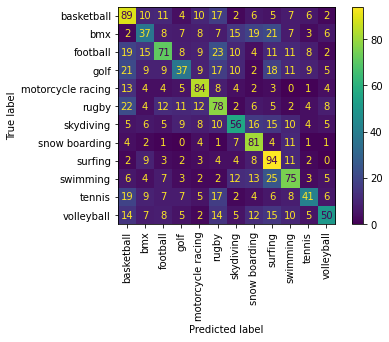

In [81]:
predicted_train = clf.predict(trainImages)
analysis(predicted_train,train_labels)

Accuracy: 0.25
Precision: 0.3055555555555555
Recall: 0.25
                   precision    recall  f1-score   support

       basketball      0.300     0.600     0.400         5
              bmx      0.500     0.200     0.286         5
         football      0.000     0.000     0.000         5
             golf      0.000     0.000     0.000         5
motorcycle racing      0.800     0.800     0.800         5
            rugby      0.333     0.200     0.250         5
        skydiving      0.333     0.400     0.364         5
    snow boarding      0.200     0.200     0.200         5
          surfing      0.200     0.400     0.267         5
         swimming      0.000     0.000     0.000         5
           tennis      1.000     0.200     0.333         5
       volleyball      0.000     0.000     0.000         5

         accuracy                          0.250        60
        macro avg      0.306     0.250     0.242        60
     weighted avg      0.306     0.250     0.242       

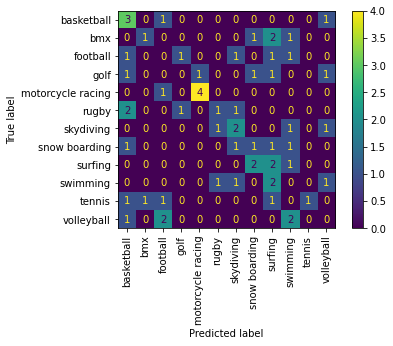

In [82]:
predicted_test = clf.predict(testImages)
analysis(predicted_test,test_labels)

In [90]:
from sklearn.svm import SVC

kernel = 'rbf'
max_iteration = 1000 
svcModel = SVC(kernel=kernel, max_iter=max_iteration, probability=True) #by default one vs rest
svcModel.fit(trainImages,train_labels)


SVC(max_iter=1000, probability=True)

Accuracy: 0.6774193548387096
Precision: 0.6914599186680277
Recall: 0.6774193548387096
                   precision    recall  f1-score   support

       basketball      0.658     0.852     0.742       169
              bmx      0.733     0.629     0.677       140
         football      0.672     0.717     0.694       191
             golf      0.794     0.490     0.606       157
motorcycle racing      0.752     0.803     0.777       132
            rugby      0.633     0.759     0.690       166
        skydiving      0.690     0.537     0.604       149
    snow boarding      0.677     0.752     0.713       117
          surfing      0.713     0.718     0.716       142
         swimming      0.577     0.790     0.667       157
           tennis      0.553     0.519     0.535       131
       volleyball      0.857     0.531     0.655       147

         accuracy                          0.677      1798
        macro avg      0.692     0.675     0.673      1798
     weighted avg      0.69

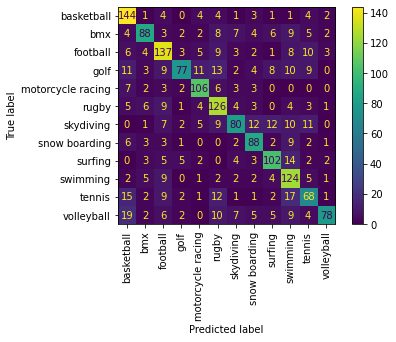

In [91]:
res = svcModel.predict_proba(trainImages)
predicted = np.argmax(res,axis=1)
analysis(predicted,train_labels)

Accuracy: 0.4166666666666667
Precision: 0.45515873015873015
Recall: 0.4166666666666667
                   precision    recall  f1-score   support

       basketball      0.500     0.800     0.615         5
              bmx      0.500     0.200     0.286         5
         football      0.429     0.600     0.500         5
             golf      1.000     0.400     0.571         5
motorcycle racing      0.800     0.800     0.800         5
            rugby      0.250     0.200     0.222         5
        skydiving      0.500     0.400     0.444         5
    snow boarding      0.250     0.200     0.222         5
          surfing      0.400     0.400     0.400         5
         swimming      0.250     0.600     0.353         5
           tennis      0.250     0.200     0.222         5
       volleyball      0.333     0.200     0.250         5

         accuracy                          0.417        60
        macro avg      0.455     0.417     0.407        60
     weighted avg      0.4

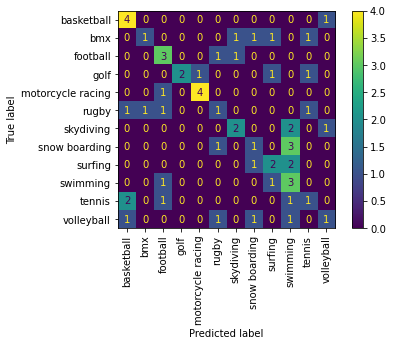

In [71]:
res = svcModel.predict_proba(testImages)
predicted = np.argmax(res,axis=1)
analysis(predicted,test_labels)

In [45]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
n_neigh = 3
knnModel = KNeighborsClassifier(n_neighbors=n_neigh)
knnModel.fit(trainImages,train_labels)

KNeighborsClassifier(n_neighbors=3)

Accuracy: 0.5367074527252503
Precision: 0.6366075981393411
Recall: 0.5367074527252503
                   precision    recall  f1-score   support

       basketball      0.655     0.787     0.715       169
              bmx      0.552     0.686     0.611       140
         football      0.515     0.634     0.568       191
             golf      0.533     0.573     0.552       157
motorcycle racing      0.762     0.485     0.593       132
            rugby      0.820     0.301     0.441       166
        skydiving      0.314     0.765     0.445       149
    snow boarding      0.842     0.410     0.552       117
          surfing      0.694     0.592     0.639       142
         swimming      0.701     0.478     0.568       157
           tennis      0.370     0.595     0.456       131
       volleyball      0.923     0.082     0.150       147

         accuracy                          0.537      1798
        macro avg      0.640     0.532     0.524      1798
     weighted avg      0.63

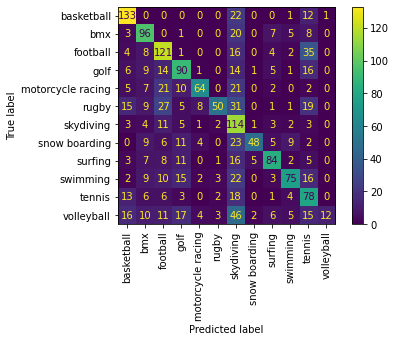

In [60]:
res = knnModel.predict_proba(trainImages)
predicted = np.argmax(res,axis=1)
analysis(predicted,train_labels)

Accuracy: 0.23333333333333334
Precision: 0.2319444444444444
Recall: 0.23333333333333334
                   precision    recall  f1-score   support

       basketball      0.333     0.200     0.250         5
              bmx      0.500     0.400     0.444         5
         football      0.000     0.000     0.000         5
             golf      0.222     0.400     0.286         5
motorcycle racing      0.750     0.600     0.667         5
            rugby      0.000     0.000     0.000         5
        skydiving      0.133     0.400     0.200         5
    snow boarding      0.000     0.000     0.000         5
          surfing      0.400     0.400     0.400         5
         swimming      0.333     0.200     0.250         5
           tennis      0.111     0.200     0.143         5
       volleyball      0.000     0.000     0.000         5

         accuracy                          0.233        60
        macro avg      0.232     0.233     0.220        60
     weighted avg      0.

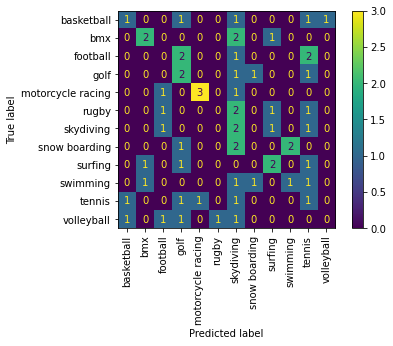

In [61]:
res = knnModel.predict_proba(testImages)
predicted = np.argmax(res,axis=1)
analysis(predicted,test_labels)